# Image alignment
Use the conda/image_mimic environment.

Python == 3.9.21
3.9.21 (main, Dec 11 2024, 16:35:24) [MSC v.1929 64 bit (AMD64)]

Image mimic using cv2
```
conda create -n image_mimic python=3.9 -y
conda activate image_mimic
conda install -c conda-forge opencv -y
python -c "import cv2; print(cv2.__version__)"

conda install -c defaults mkl mkl-service mkl_fft mkl_random --force-reinstall

"import cv2; print(cv2.__version__)"
# 4.10.0

conda install -c conda-forge matplotlib seaborn pandas scikit-image plotly -y

```


In [10]:
# python version
import sys
print("Python version: " + sys.version)
print("Version info: ", end="")
print(sys.version_info)

import cv2
print("cv2 version: " + cv2.__version__)


Python version: 3.9.21 (main, Dec 11 2024, 16:35:24) [MSC v.1929 64 bit (AMD64)]
Version info: sys.version_info(major=3, minor=9, micro=21, releaselevel='final', serial=0)
cv2 version: 4.10.0


# A demo

In [ ]:
## import packages
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import os
import math


## Mimic the demo images


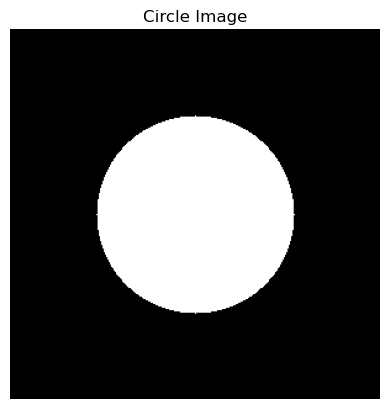

In [5]:
# test
import cv2
import numpy as np
import matplotlib.pyplot as plt

img = np.zeros((300, 300), dtype=np.uint8)
cv2.circle(img, (150, 150), 80, 255, -1)

plt.imshow(img, cmap='gray')
plt.title("Circle Image")
plt.axis('off')
plt.show()


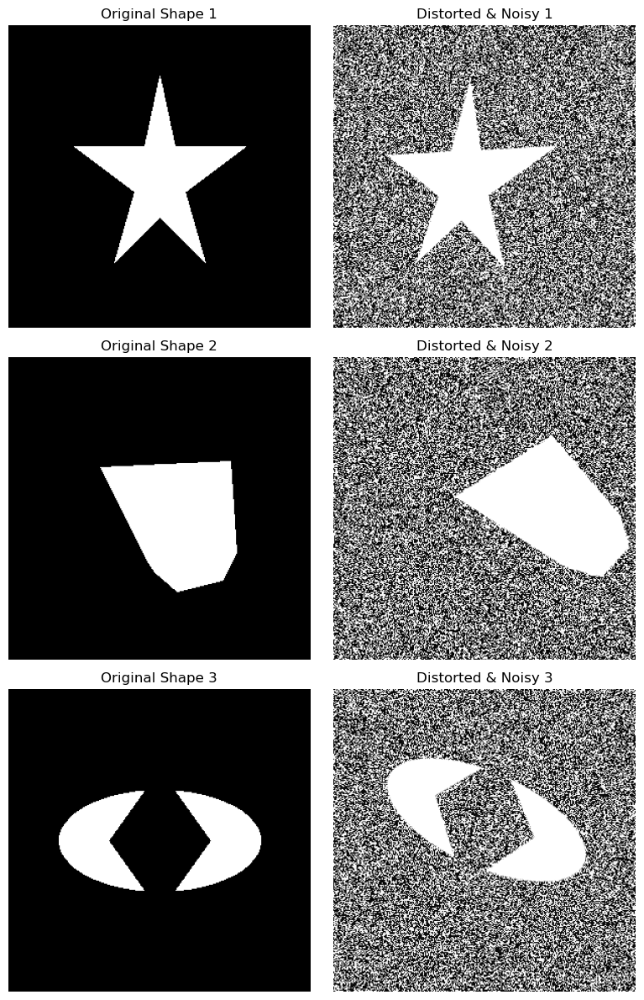

In [7]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

def add_noise(img, sigma=10):
    noise = np.random.normal(0, sigma, img.shape).astype(np.uint8)
    return cv2.add(img, noise)

# Create blank images
size = 300
imgs_orig = []
imgs_dist = []

# Example 1: Star shape
img1 = np.zeros((size, size), dtype=np.uint8)
star = np.array([[150, 50], [165, 120], [235, 120],
                 [175, 165], [195, 235], [150, 190],
                 [105, 235], [125, 165], [65, 120],
                 [135, 120]], np.int32).reshape((-1,1,2))
cv2.fillPoly(img1, [star], 255)
pts1 = np.float32([[0,0],[size,0],[size,size],[0,size]])
pts2 = pts1 + np.random.uniform(-30,30,(4,2)).astype(np.float32)
M_persp = cv2.getPerspectiveTransform(pts1, pts2)
dist1 = cv2.warpPerspective(img1, M_persp, (size, size), borderValue=0)
dist1 = add_noise(dist1, sigma=15)
imgs_orig.append(img1); imgs_dist.append(dist1)

# Example 2: Complex polygon (random convex hull)
img2 = np.zeros((size, size), dtype=np.uint8)
pts = np.random.randint(50, size-50, (10,2))
hull = cv2.convexHull(pts)
cv2.fillPoly(img2, [hull], 255)
angle = 25
M_affine = cv2.getRotationMatrix2D((size/2,size/2), angle, 1.0)
shear = np.array([[1, 0.3, 0],[0.0, 1, 0]])
M_affine[:2] = shear.dot(np.vstack([M_affine, [0,0,1]]))[:2]
dist2 = cv2.warpAffine(img2, M_affine, (size, size), borderValue=0)
dist2 = add_noise(dist2, sigma=10)
imgs_orig.append(img2); imgs_dist.append(dist2)

# Example 3: Ellipse + polygon
img3 = np.zeros((size, size), dtype=np.uint8)
cv2.ellipse(img3, (150,150), (100,50), 0, 0, 360, 255, -1)
poly = np.array([[150,80],[200,150],[150,220],[100,150]], np.int32).reshape((-1,1,2))
cv2.fillPoly(img3, [poly], 0)
M_aff = cv2.getRotationMatrix2D((size/2,size/2), -15, 1)
pts2b = pts1 + np.array([[20,-20],[-20,20],[30,30],[-30,-30]], np.float32)
M_persp2 = cv2.getPerspectiveTransform(pts1, pts2b)
temp = cv2.warpAffine(img3, M_aff, (size,size), borderValue=0)
dist3 = cv2.warpPerspective(temp, M_persp2, (size,size), borderValue=0)
dist3 = add_noise(dist3, sigma=12)
imgs_orig.append(img3); imgs_dist.append(dist3)

# Display images
fig, axes = plt.subplots(3, 2, figsize=(8, 12))
for i in range(3):
    axes[i,0].imshow(imgs_orig[i], cmap='gray')
    axes[i,0].set_title(f'Original Shape {i+1}')
    axes[i,0].axis('off')
    axes[i,1].imshow(imgs_dist[i], cmap='gray')
    axes[i,1].set_title(f'Distorted & Noisy {i+1}')
    axes[i,1].axis('off')
plt.tight_layout()
plt.show()

# Save images to 'demo.images/' folder
os.makedirs("demo.images", exist_ok=True)
for i in range(3):
    cv2.imwrite(f"demo.images/original_shape_{i+1}.png", imgs_orig[i])
    cv2.imwrite(f"demo.images/distorted_shape_{i+1}.png", imgs_dist[i])


## 方法一：使用 OpenCV 的 ECC 算法（仿射或单应性）

`findTransformECC` 可以在灰度图像间直接估计最佳对齐变换，支持以下几种模式：

- `cv2.MOTION_EUCLIDEAN` —— 仅旋转+平移
- `cv2.MOTION_AFFINE`   —— 旋转+平移+缩放+剪切
- `cv2.MOTION_HOMOGRAPHY` —— 3×3 单应性（透视变形）

下面示例用仿射模式（`MOTION_AFFINE`）来估计，最后依旧从变换矩阵中解出旋转角度。

Notes:
- 如果扭曲更强，可以将 `warp_mode` 换成 `cv2.MOTION_HOMOGRAPHY`，此时 `warp_matrix` 是 3×3 的单应矩阵。
- ECC 对噪声和光照变化也较为稳健，但对大位移或大角度差异收敛速度会变慢，可以适当调高迭代次数或用金字塔策略（先下采样对齐、再精细对齐）。

Estimated rotation angle: 176.28°


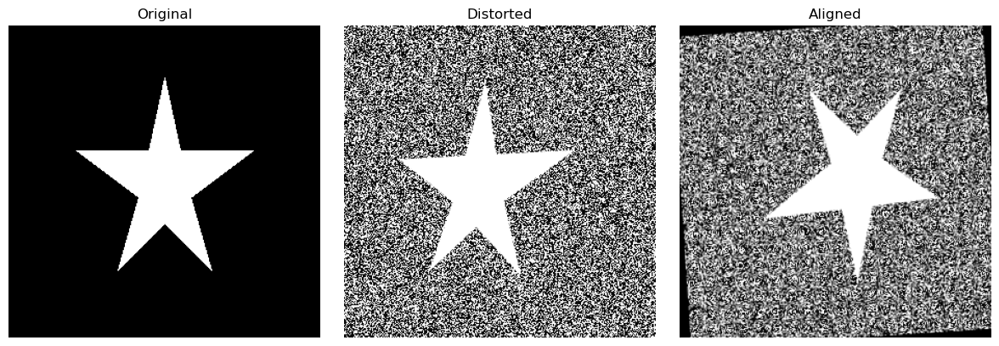

In [ ]:
# test 1
import cv2
import numpy as np
import math
import matplotlib.pyplot as plt

# Load original and distorted image from 'demo.images/'
img1 = cv2.imread('demo.images/original_shape_1.png', cv2.IMREAD_GRAYSCALE)
img2 = cv2.imread('demo.images/distorted_shape_1.png', cv2.IMREAD_GRAYSCALE)

# Initialize affine transformation matrix (identity)
warp_matrix = np.eye(2, 3, dtype=np.float32)

# ECC termination criteria
criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 5000, 1e-8)

# Estimate affine transform using ECC
warp_mode = cv2.MOTION_AFFINE
cc, warp_matrix = cv2.findTransformECC(img1, img2, warp_matrix, warp_mode, criteria)

# Extract rotation angle in degrees
a, b = warp_matrix[0, 0], warp_matrix[0, 1]
angle = math.degrees(math.atan2(b, a))

# Normalize to range [0, 180)
angle = angle % 180

print(f'Estimated rotation angle: {angle:.2f}°')

# Rotate distorted image back to match original
center = (img2.shape[1] // 2, img2.shape[0] // 2)
rot_matrix = cv2.getRotationMatrix2D(center, -angle, 1.0)
img2_aligned = cv2.warpAffine(img2, rot_matrix, (img2.shape[1], img2.shape[0]), borderValue=0)

# Show images side by side
fig, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].imshow(img1, cmap='gray')
axes[0].set_title('Original')
axes[0].axis('off')

axes[1].imshow(img2, cmap='gray')
axes[1].set_title('Distorted')
axes[1].axis('off')

axes[2].imshow(img2_aligned, cmap='gray')
axes[2].set_title('Aligned')
axes[2].axis('off')

plt.tight_layout()
plt.show()


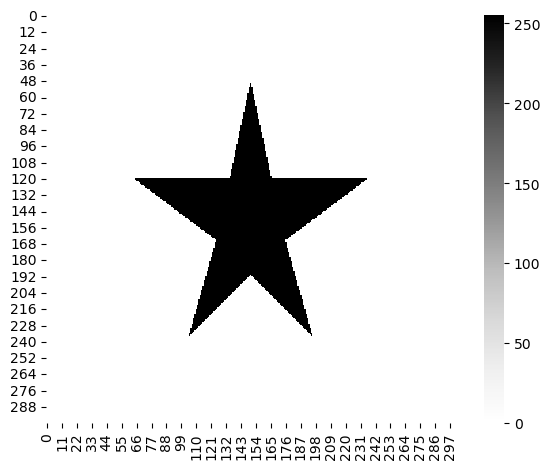

In [ ]:

plt.figure(figsize=(8, 8))
sns.heatmap(b_orig, cmap='Greys', cbar=True, square=True)
# plt.title('Binary Mask Heatmap (70x70)')
# plt.xlabel('X-axis (Columns)')
# plt.ylabel('Y-axis (Rows)')
plt.tight_layout()
plt.show()

plt.show()



Estimated rotation angle: 179.54°


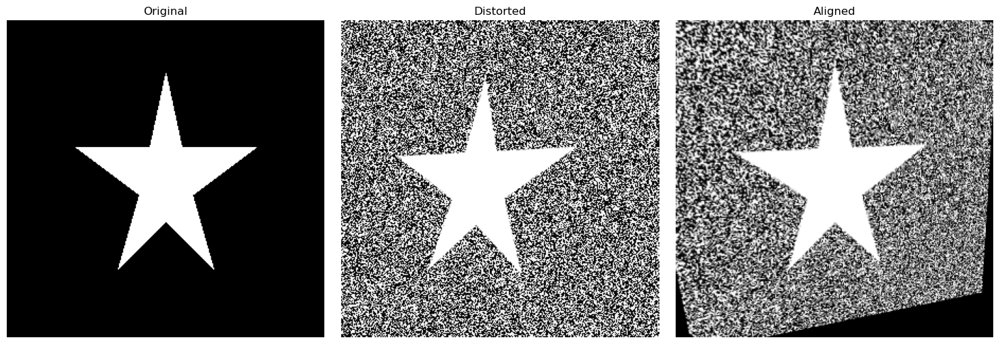

In [10]:
# test 2
import cv2
import numpy as np
import math
import matplotlib.pyplot as plt

# 1. Load grayscale images
img_orig = cv2.imread('demo.images/original_shape_1.png', cv2.IMREAD_GRAYSCALE)
img_dist = cv2.imread('demo.images/distorted_shape_1.png', cv2.IMREAD_GRAYSCALE)

# 2. Binarize (remove noise) so ORB focuses on the shape
_, b_orig = cv2.threshold(img_orig, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
_, b_dist = cv2.threshold(img_dist, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# 3. Detect ORB features on the clean masks
orb = cv2.ORB_create(5000)
kp1, des1 = orb.detectAndCompute(b_orig, None)
kp2, des2 = orb.detectAndCompute(b_dist, None)

# 4. Match and pick the best 30%
bf = cv2.BFMatcher(cv2.NORM_HAMMING)
matches = sorted(bf.match(des1, des2), key=lambda m: m.distance)
good = matches[: int(len(matches)*0.3)]

# 5. Build point sets
pts_orig = np.float32([kp1[m.queryIdx].pt for m in good])
pts_dist = np.float32([kp2[m.trainIdx].pt for m in good])

# 6. Estimate a homography (handles perspective + affine)
H, mask = cv2.findHomography(pts_dist, pts_orig, cv2.RANSAC, 5.0)

# 7. Decompose the top‐left 2×2 of H to get a pure rotation
A = H[0:2, 0:2]
# Use SVD to strip out any scaling/shear, leaving only R
U, S, Vt = np.linalg.svd(A)
R = U @ Vt
# Compute angle in [0, 180)
angle = math.degrees(math.atan2(R[1,0], R[0,0])) % 180
print(f'Estimated rotation angle: {angle:.2f}°')

# 8. Warp the distorted image back with the full homography
h, w = img_orig.shape
img_aligned = cv2.warpPerspective(img_dist, H, (w, h), flags=cv2.INTER_LINEAR, borderValue=0)

# 9. Show the three stages side-by-side
fig, ax = plt.subplots(1, 3, figsize=(15, 5))
for a, im, title in zip(ax,
                       [img_orig, img_dist, img_aligned],
                       ['Original', 'Distorted', 'Aligned']):
    a.imshow(im, cmap='gray')
    a.set_title(title)
    a.axis('off')
plt.tight_layout()
plt.show()


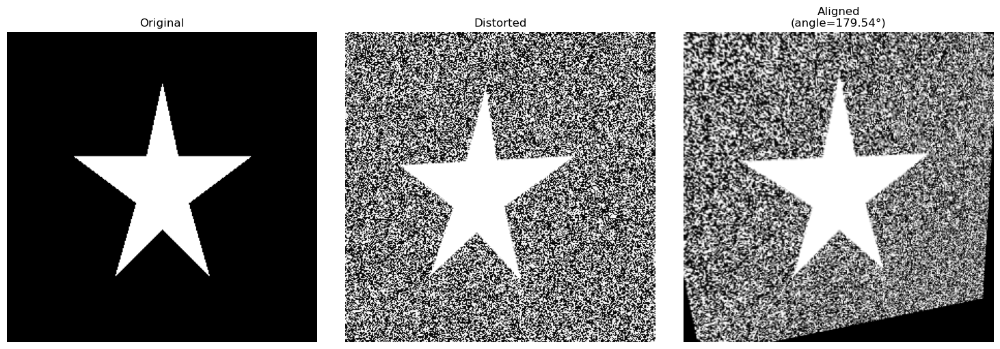

Shape 1: rotation = 179.54°


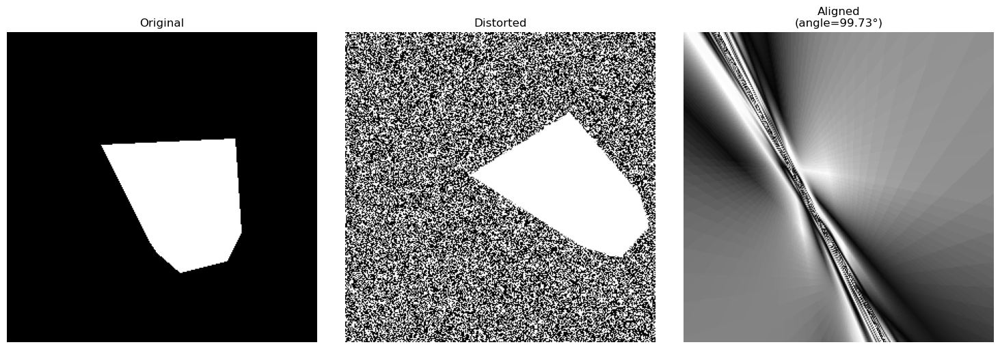

Shape 2: rotation = 99.73°


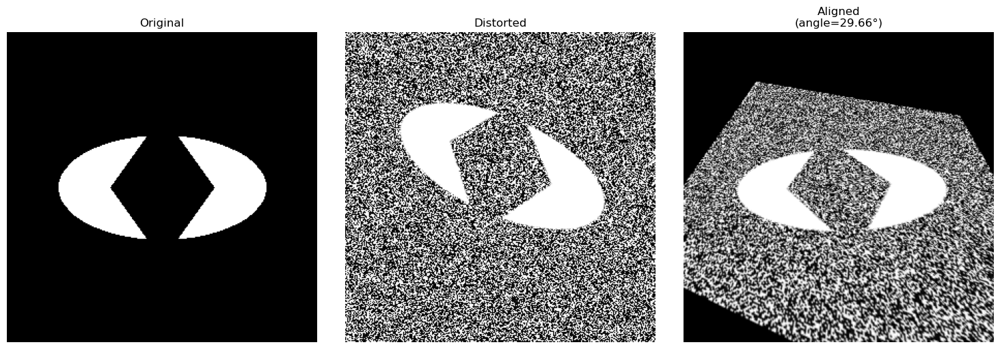

Shape 3: rotation = 29.66°


In [21]:
# formal
import cv2
import numpy as np
import math
import matplotlib.pyplot as plt

def align_shape(index, images_dir='demo.images', match_ratio=0.3, n_features=5000, show=True):
    """
    Aligns a distorted binary shape image back to its original orientation.
    
    Parameters:
    - index (int): the shape number (e.g. 1, 2, 3) corresponding to files
        'original_shape_{index}.png' and 'distorted_shape_{index}.png' in images_dir.
    - images_dir (str): folder where your PNGs live.
    - match_ratio (float): fraction of top ORB matches to keep (0 < match_ratio ≤ 1).
    - n_features (int): maximum number of ORB keypoints to detect.
    - show (bool): if True, display Original, Distorted, and Aligned side by side.
    
    Returns:
    - angle (float): estimated rotation angle in [0, 180) degrees.
    - img_aligned (ndarray): the warped & aligned distorted image.
    """
    # 1. Load grayscale images
    orig_path = f'{images_dir}/original_shape_{index}.png'
    dist_path = f'{images_dir}/distorted_shape_{index}.png'
    img_orig = cv2.imread(orig_path, cv2.IMREAD_GRAYSCALE)
    img_dist = cv2.imread(dist_path, cv2.IMREAD_GRAYSCALE)
    
    # 2. Binarize to remove noise (OTSU threshold)
    _, b_orig = cv2.threshold(img_orig, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    _, b_dist = cv2.threshold(img_dist, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    # 3. Detect ORB features and compute descriptors
    orb = cv2.ORB_create(n_features)
    kp1, des1 = orb.detectAndCompute(b_orig, None)
    kp2, des2 = orb.detectAndCompute(b_dist, None)
    
    # 4. Match descriptors with Brute-Force + Hamming
    bf = cv2.BFMatcher(cv2.NORM_HAMMING)
    matches = sorted(bf.match(des1, des2), key=lambda m: m.distance)
    top_n = int(len(matches) * match_ratio)
    matches = matches[:max(top_n, 4)]  # need at least 4 for homography
    
    # 5. Build point correspondences
    pts_orig = np.float32([kp1[m.queryIdx].pt for m in matches])
    pts_dist = np.float32([kp2[m.trainIdx].pt for m in matches])
    
    # 6. Estimate homography via RANSAC
    H, mask = cv2.findHomography(pts_dist, pts_orig, cv2.RANSAC, 5.0)
    
    # 7. Extract pure rotation: SVD of the 2×2 linear part
    A = H[0:2, 0:2]
    U, _, Vt = np.linalg.svd(A)
    R = U @ Vt
    angle = (math.degrees(math.atan2(R[1,0], R[0,0])) + 360) % 180
    
    # 8. Warp the distorted image back with full homography
    h, w = img_orig.shape
    img_aligned = cv2.warpPerspective(img_dist, H, (w, h),
                                      flags=cv2.INTER_LINEAR,
                                      borderValue=0)
    
    # 9. Optionally display results
    if show:
        fig, ax = plt.subplots(1, 3, figsize=(15, 5))
        for a, im, title in zip(ax,
                               [img_orig, img_dist, img_aligned],
                               ['Original', 'Distorted', f'Aligned\n(angle={angle:.2f}°)']):
            a.imshow(im, cmap='gray')
            a.set_title(title)
            a.axis('off')
        plt.tight_layout()
        plt.show()
    
    return angle, img_aligned

# Example: process shapes 1, 2, and 3
for i in range(1, 4):
    ang, aligned_img = align_shape(i)
    print(f'Shape {i}: rotation = {ang:.2f}°')


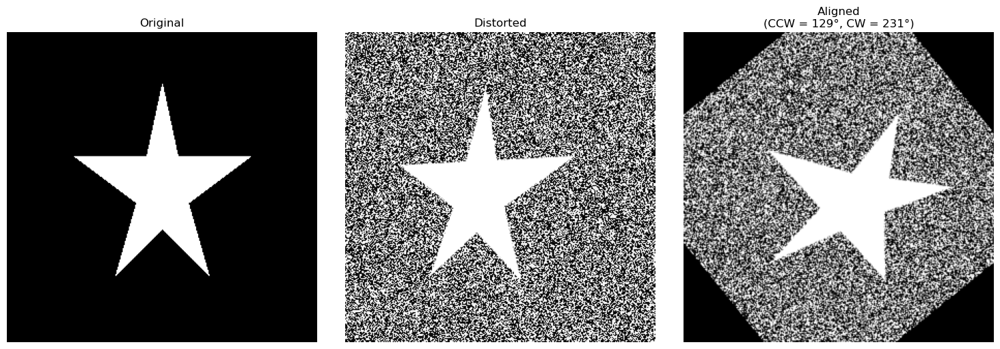

Shape 1: best rotation = 129° CCW  /  231° CW


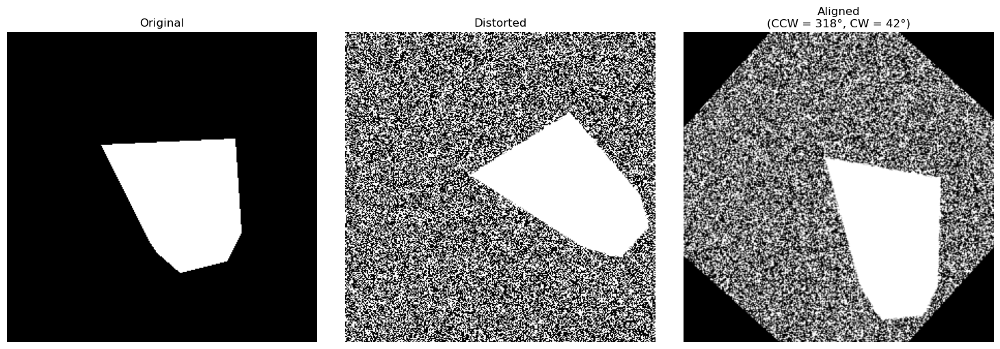

Shape 2: best rotation = 318° CCW  /  42° CW


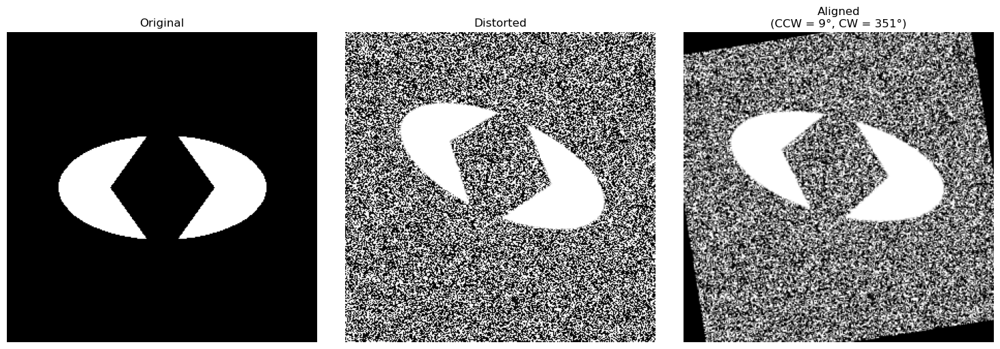

Shape 3: best rotation = 9° CCW  /  351° CW


In [31]:
# verrsion 0.1
import cv2
import numpy as np
import math
import matplotlib.pyplot as plt

def best_rotation_by_overlap(mask_orig, mask_dist, step=1):
    """
    Search θ in [0,360) with increment `step` that maximizes
    the pixel‐wise AND overlap between mask_orig and rotated mask_dist.
    Returns the best θ (in degrees, CCW-positive).
    """
    h, w = mask_orig.shape
    center = (w/2, h/2)
    best_score = -1
    best_theta = 0

    for theta in np.arange(0, 360, step):
        M = cv2.getRotationMatrix2D(center, theta, 1.0)
        rot = cv2.warpAffine(mask_dist, M, (w, h),
                             flags=cv2.INTER_NEAREST,
                             borderValue=0)
        # Overlap = count of pixels where both are white
        score = int(np.sum((mask_orig>0) & (rot>0)))
        if score > best_score:
            best_score = score
            best_theta = theta

    return best_theta

def align_shape_bruteforce(index, images_dir='demo.images', show=True):
    """
    1. Load original + distorted as grayscale.
    2. Binarize with Otsu → mask_orig, mask_dist.
    3. Find best CCW rotation via brute‐force overlap search.
    4. Rotate distorted <grayscale> by that angle to align.
    5. (CW‐positive angle = (360 – θ) % 360 if you need it.)
    """
    # — 1. Load —
    orig = cv2.imread(f'{images_dir}/original_shape_{index}.png', cv2.IMREAD_GRAYSCALE)
    dist = cv2.imread(f'{images_dir}/distorted_shape_{index}.png', cv2.IMREAD_GRAYSCALE)

    # — 2. Binarize —
    _, mask_o = cv2.threshold(orig, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    _, mask_d = cv2.threshold(dist, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # — 3. Brute‐force search for best CCW θ —
    best_ccw = best_rotation_by_overlap(mask_o, mask_d, step=1)
    # If you prefer “CW-positive” angle:
    best_cw = (360 - best_ccw) % 360

    # — 4. Rotate grayscale distorted by best_ccw CCW (i.e. best_cw CW) —
    h, w = dist.shape
    M = cv2.getRotationMatrix2D((w/2, h/2), best_ccw, 1.0)
    aligned = cv2.warpAffine(dist, M, (w, h),
                             flags=cv2.INTER_LINEAR,
                             borderValue=0)

    # — 5. Display —
    if show:
        fig, ax = plt.subplots(1, 3, figsize=(15,5))
        for a, im, title in zip(ax,
                               [orig, dist, aligned],
                               ['Original','Distorted',
                                f'Aligned\n(CCW = {best_ccw:.0f}°, CW = {best_cw:.0f}°)']):
            a.imshow(im, cmap='gray'); a.set_title(title); a.axis('off')
        plt.tight_layout()
        plt.show()

    return best_ccw, best_cw, aligned

# Test on shapes 1–3
for i in range(1,4):
    ccw, cw, _ = align_shape_bruteforce(i)
    print(f'Shape {i}: best rotation = {ccw:.0f}° CCW  /  {cw:.0f}° CW')





Running example with dummy images...

--- Processing Test Index: 1 ---
Generated test images for Index 1 with a true CCW rotation of 0° for Image2.
1. Image1 needs to rotate approx. 0.00 degrees counter-clockwise to become Image2 (Index: 1).


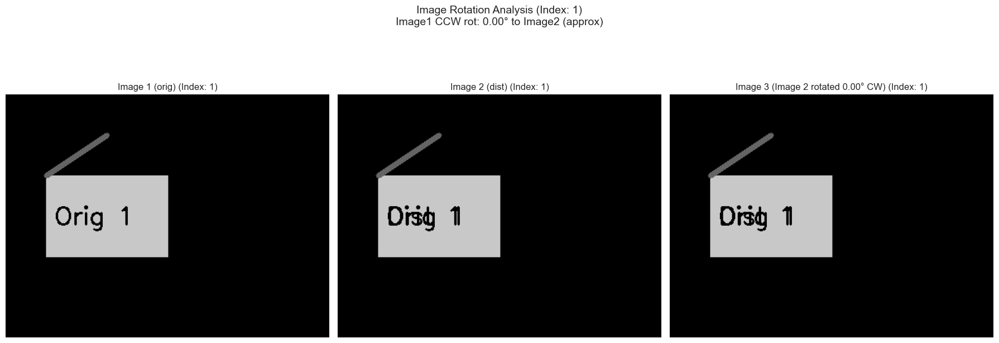

Function returned CCW angle: 0.00° for Index 1

--- Processing Test Index: 2 ---
Generated test images for Index 2 with a true CCW rotation of 30° for Image2.
1. Image1 needs to rotate approx. -29.96 degrees counter-clockwise to become Image2 (Index: 2).


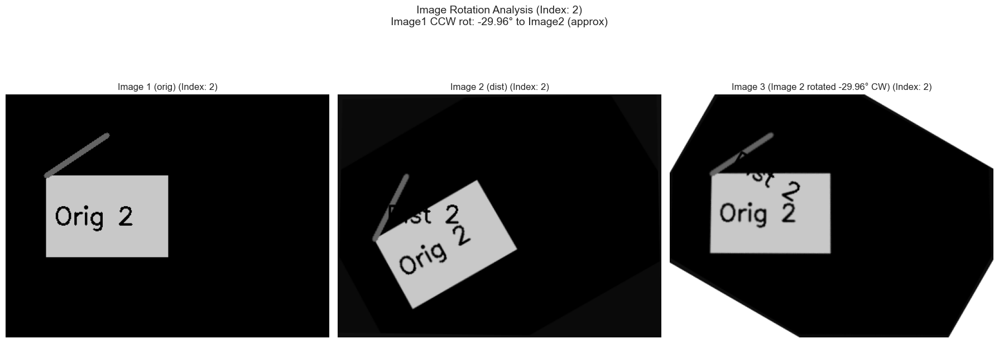

Function returned CCW angle: -29.96° for Index 2

--- Processing Test Index: 3 ---
Generated test images for Index 3 with a true CCW rotation of -45° for Image2.
1. Image1 needs to rotate approx. 44.98 degrees counter-clockwise to become Image2 (Index: 3).


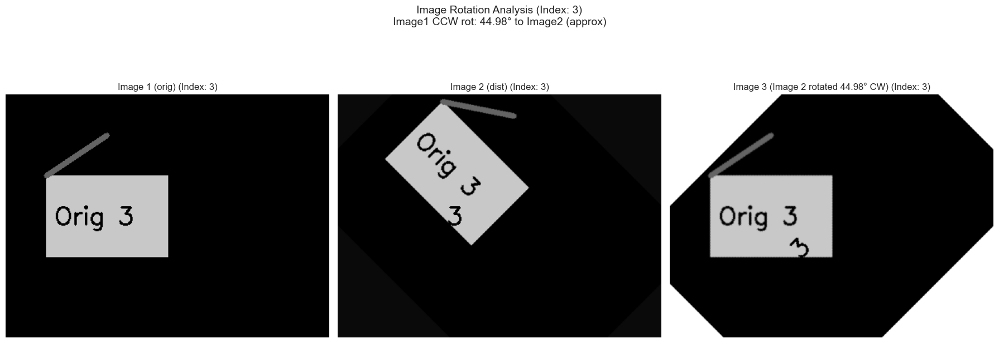

Function returned CCW angle: 44.98° for Index 3

--- Summary of Calculated Angles (Image1 to Image2 CCW) ---
Test Index 1: 0.00°
Test Index 2: -29.96°
Test Index 3: 44.98°


In [49]:
# version 0.2
import cv2
import numpy as np
import math
import matplotlib.pyplot as plt

def calculate_rotation_for_loaded_images(img1_gray, img2_gray, img1_bgr_display, img2_bgr_display, image_index=None):
    """
    Calculates the rotation angle from img1_gray to img2_gray and displays comparison.
    Image3 is generated by rotating img2_gray clockwise by the calculated CCW angle from img1 to img2,
    aiming to align Image3 with Image1's orientation.

    Args:
        img1_gray (numpy.ndarray): Grayscale image 1 (e.g., your 'orig').
        img2_gray (numpy.ndarray): Grayscale image 2 (e.g., your 'dist').
        img1_bgr_display (numpy.ndarray): BGR version of image 1 for display.
        img2_bgr_display (numpy.ndarray): BGR version of image 2 for display.
        image_index (int, optional): An index to include in plot titles. Defaults to None.

    Returns:
        float: The counter-clockwise rotation angle in degrees for img1_gray to become img2_gray.
               Returns 0.0 if the angle cannot be determined.
    """
    if img1_gray is None or img2_gray is None:
        print(f"Error (Index: {image_index if image_index else 'N/A'}): One or both grayscale images are None.")
        return 0.0
    if img1_bgr_display is None or img2_bgr_display is None:
        print(f"Warning (Index: {image_index if image_index else 'N/A'}): One or both BGR images for display are None. Will try to convert from grayscale.")
        if img1_gray is not None and img1_bgr_display is None:
            img1_bgr_display = cv2.cvtColor(img1_gray, cv2.COLOR_GRAY2BGR)
        if img2_gray is not None and img2_bgr_display is None:
            img2_bgr_display = cv2.cvtColor(img2_gray, cv2.COLOR_GRAY2BGR)
        if img1_bgr_display is None or img2_bgr_display is None: # Still None
            print(f"Error (Index: {image_index if image_index else 'N/A'}): Failed to get BGR images for display.")
            return 0.0

    # --- Feature Detection and Matching ---
    # Use ORB (Oriented FAST and Rotated BRIEF) detector
    orb = cv2.ORB_create(nfeatures=2000) # Number of features to detect

    # Detect keypoints and compute descriptors
    kp1, des1 = orb.detectAndCompute(img1_gray, None)
    kp2, des2 = orb.detectAndCompute(img2_gray, None)

    if des1 is None or des2 is None or len(kp1) == 0 or len(kp2) == 0:
        print(f"Error (Index: {image_index if image_index else 'N/A'}): Not enough features detected in one or both images.")
        return 0.0

    # Use BFMatcher (Brute-Force Matcher) with Hamming distance for ORB descriptors
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True) # crossCheck for better matches
    try:
        matches = bf.match(des1, des2)
    except cv2.error as e:
        print(f"Error (Index: {image_index if image_index else 'N/A'}): Feature matching failed - {e}")
        return 0.0

    # Sort matches by their distance (lower distance is better)
    matches = sorted(matches, key=lambda x: x.distance)
    
    # Select a number of good matches
    # Using a portion of matches, but at least 10, and capped at 50.
    num_good_matches = min(50, max(10, len(matches) // 4 if len(matches) >= 40 else len(matches)))
    good_matches = matches[:num_good_matches]

    if len(good_matches) < 4: # RANSAC needs at least 4 points
        print(f"Error (Index: {image_index if image_index else 'N/A'}): Not enough good matches to estimate transform (need at least 4, got {len(good_matches)}).")
        return 0.0

    # Extract coordinates of good matches
    pts1 = np.float32([kp1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    pts2 = np.float32([kp2[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

    # --- Estimate Transformation and Extract Rotation Angle ---
    # Estimate partial affine transformation (handles rotation, translation, scale, shear)
    # M_affine transforms points from img1_gray to img2_gray (pts2 ~ M_affine * pts1)
    M_affine, inliers = cv2.estimateAffinePartial2D(pts1, pts2, method=cv2.RANSAC, ransacReprojThreshold=5.0)

    angle_ccw_img1_to_img2 = 0.0 # Initialize angle

    if M_affine is not None:
        # Extract rotation angle from the affine matrix M_affine = [[a, b, tx], [c, d, ty]]
        # angle = atan2(c, a) or atan2(M[1,0], M[0,0])
        # This angle is the CCW rotation from image1's coordinate system to image2's.
        angle_rad = math.atan2(M_affine[1, 0], M_affine[0, 0])
        angle_ccw_img1_to_img2 = math.degrees(angle_rad)
    else:
        print(f"Warning (Index: {image_index if image_index else 'N/A'}): Could not estimate affine transform. Angle set to 0.")
        # image3 will be a copy of image2 if no angle is found
        img3_bgr = img2_bgr_display.copy()


    # --- Output and Image3 Generation ---
    title_suffix = f" (Index: {image_index})" if image_index is not None else ""
    print(f"1. Image1 needs to rotate approx. {angle_ccw_img1_to_img2:.2f} degrees counter-clockwise to become Image2{title_suffix}.")

    # To make Image3 align with Image1's orientation:
    # Image2 needs to be rotated CLOCKWISE by angle_ccw_img1_to_img2.
    # For OpenCV's getRotationMatrix2D, which takes a CCW angle,
    # this means rotating by -angle_ccw_img1_to_img2 (CCW).
    # angle_for_img3_ccw = -angle_ccw_img1_to_img2
    angle_for_img3_ccw = angle_ccw_img1_to_img2
    
    rows2, cols2 = img2_bgr_display.shape[:2]
    center2 = (cols2 // 2, rows2 // 2) # Rotation center for Image2

    # Get the rotation matrix for Image3
    rotation_matrix_img2_to_img3 = cv2.getRotationMatrix2D(center2, angle_for_img3_ccw, 1.0) # Scale = 1.0

    # Apply the rotation to Image2 to get Image3
    # Fill border with white for clarity
    img3_bgr = cv2.warpAffine(img2_bgr_display, rotation_matrix_img2_to_img3, (cols2, rows2), borderMode=cv2.BORDER_CONSTANT, borderValue=(255,255,255))

    # --- Display Results ---
    plt.style.use('seaborn-v0_8-whitegrid') # Using a visually appealing style
    fig, axes = plt.subplots(1, 3, figsize=(18, 7))

    axes[0].imshow(cv2.cvtColor(img1_bgr_display, cv2.COLOR_BGR2RGB))
    axes[0].set_title(f'Image 1 (orig){title_suffix}')
    axes[0].axis('off')

    axes[1].imshow(cv2.cvtColor(img2_bgr_display, cv2.COLOR_BGR2RGB))
    axes[1].set_title(f'Image 2 (dist){title_suffix}')
    axes[1].axis('off')

    axes[2].imshow(cv2.cvtColor(img3_bgr, cv2.COLOR_BGR2RGB))
    # Title for Image3 describes the rotation applied to Image2
    # If angle_ccw_img1_to_img2 is 30, then Image2 is rotated 30 deg CW.
    # If angle_ccw_img1_to_img2 is -30 (i.e. 30 deg CW from 1 to 2), then Image2 is rotated -30 deg CW (i.e. 30 deg CCW).
    axes[2].set_title(f'Image 3 (Image 2 rotated {angle_ccw_img1_to_img2:.2f}° CW){title_suffix}')
    axes[2].axis('off')
    
    main_title = f'Image Rotation Analysis{title_suffix}\nImage1 CCW rot: {angle_ccw_img1_to_img2:.2f}° to Image2 (approx)'
    plt.suptitle(main_title, fontsize=14)
    plt.tight_layout(rect=[0, 0.03, 1, 0.93]) # Adjust layout for super title
    plt.show()
    
    # Optional: Display good matches for debugging
    # img_good_matches = cv2.drawMatches(img1_bgr_display, kp1, img2_bgr_display, kp2, good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    # plt.figure(figsize=(12, 6))
    # plt.imshow(cv2.cvtColor(img_good_matches, cv2.COLOR_BGR2RGB))
    # plt.title(f'{len(good_matches)} Best Feature Matches{title_suffix}')
    # plt.axis('off')
    # plt.show()

    return angle_ccw_img1_to_img2

# --- Example of how you might call this in your loop ---
# This part is for demonstration. You'll integrate the function call into your existing loop.

def create_dummy_images_for_testing(index_val):
    """Helper to create dummy images for testing the main function."""
    # Create a base non-symmetrical image
    base_img_gray = np.zeros((300, 400), dtype=np.uint8) # Rectangular
    cv2.rectangle(base_img_gray, (50, 100), (200, 200), 200, -1) 
    cv2.line(base_img_gray, (50,100), (125,50), 100, 5) # Asymmetric line
    cv2.putText(base_img_gray, f"Orig {index_val}", (60, 160), cv2.FONT_HERSHEY_SIMPLEX, 1, 0, 2) # Black text

    # Define rotation angles for testing
    test_angles = [0, 30, -45, 60, 190] # CCW angles
    angle_for_this_index = test_angles[(index_val -1) % len(test_angles)]

    rows, cols = base_img_gray.shape[:2]
    center = (cols // 2, rows // 2)

    # Create rotated image (distorted image)
    M_rot = cv2.getRotationMatrix2D(center, angle_for_this_index, 1.0)
    dist_img_gray = cv2.warpAffine(base_img_gray, M_rot, (cols, rows), borderValue=10) # Dark gray border
    cv2.putText(dist_img_gray, f"Dist {index_val}", (60, 160), cv2.FONT_HERSHEY_SIMPLEX, 1, 0, 2)


    # Add some minor perspective distortion to dist_img_gray for some indices
    if index_val % 2 == 0: # Apply to even indices
        pts1_warp = np.float32([[0,0],[cols-1,0],[0,rows-1],[cols-1,rows-1]])
        shift = index_val * 3
        pts2_warp = np.float32([[shift,shift],[cols-1-shift,0],[0,rows-1-shift],[cols-1,rows-1]])
        try:
            M_perspective = cv2.getPerspectiveTransform(pts1_warp, pts2_warp)
            dist_img_gray = cv2.warpPerspective(dist_img_gray, M_perspective, (cols,rows), borderValue=15)
        except cv2.error: # if points are collinear, etc.
            pass # Keep the rotated image without this additional perspective

    # Create BGR versions for display
    orig_bgr = cv2.cvtColor(base_img_gray, cv2.COLOR_GRAY2BGR)
    dist_bgr = cv2.cvtColor(dist_img_gray, cv2.COLOR_GRAY2BGR)
    
    return base_img_gray, dist_img_gray, orig_bgr, dist_bgr, angle_for_this_index

if __name__ == '__main__':
    # This is a self-contained example run
    print("Running example with dummy images...")
    all_calculated_angles = {}

    for i in range(1, 4): # Test for a few indices
        print(f"\n--- Processing Test Index: {i} ---")
        
        # In your actual code, you would load 'orig' and 'dist' like this:
        # images_dir = 'your_actual_directory'
        # orig_gray_loaded = cv2.imread(f'{images_dir}/original_shape_{i}.png', cv2.IMREAD_GRAYSCALE)
        # dist_gray_loaded = cv2.imread(f'{images_dir}/distorted_shape_{i}.png', cv2.IMREAD_GRAYSCALE)
        # orig_bgr_loaded = cv2.imread(f'{images_dir}/original_shape_{i}.png')
        # dist_bgr_loaded = cv2.imread(f'{images_dir}/distorted_shape_{i}.png')

        # Using dummy images for this example:
        orig_gray, dist_gray, orig_bgr, dist_bgr, true_angle = create_dummy_images_for_testing(i)
        print(f"Generated test images for Index {i} with a true CCW rotation of {true_angle}° for Image2.")

        if orig_gray is None or dist_gray is None:
            print(f"Error generating dummy images for Index {i}. Skipping.")
            continue

        calculated_angle = calculate_rotation_for_loaded_images(
            orig_gray, 
            dist_gray, 
            orig_bgr, # Pass BGR for display
            dist_bgr, # Pass BGR for display
            image_index=i
        )
        all_calculated_angles[i] = calculated_angle
        print(f"Function returned CCW angle: {calculated_angle:.2f}° for Index {i}")

    print("\n--- Summary of Calculated Angles (Image1 to Image2 CCW) ---")
    for index_val, angle in all_calculated_angles.items():
        print(f"Test Index {index_val}: {angle:.2f}°")

Not enough matches are found - 0/4


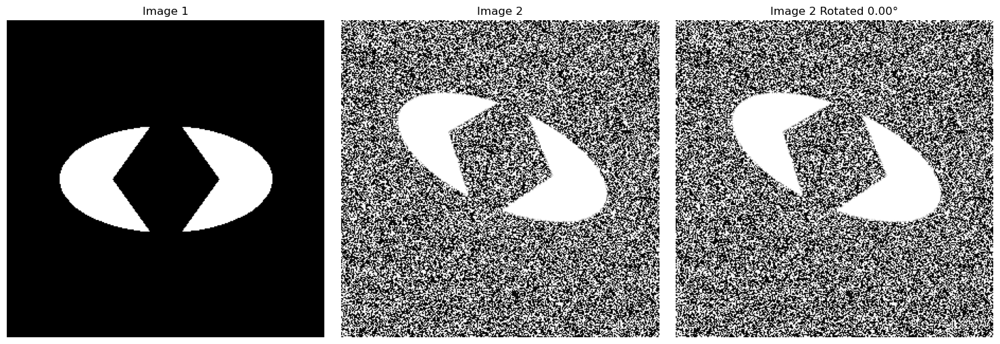

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 读取两张待对比的图像（灰度模式）
img1 = cv2.imread('demo.images/original_shape_3.png', cv2.IMREAD_GRAYSCALE)  # 原始图像
img2 = cv2.imread('demo.images/distorted_shape_3.png', cv2.IMREAD_GRAYSCALE)  # 待校正旋转的噪声图像

if img1 is None or img2 is None:
    print("Could not open or find the images.")
    exit()

# 初始化 ORB 特征检测器，增加特征点数量以提高鲁棒性
orb = cv2.ORB_create(nfeatures=1000)
# 检测并计算关键点和描述子
kp1, des1 = orb.detectAndCompute(img1, None)
kp2, des2 = orb.detectAndCompute(img2, None)

if des1 is None or des2 is None:
    print("No descriptors found in one or both images, cannot compute rotation.")
else:
    # 使用 BFMatcher 的 KNN 模式匹配特征点，并应用 Lowe 的比值测试筛选匹配对
    matcher = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=False)
    knn_matches = matcher.knnMatch(des1, des2, k=2)
    good_matches = []
    ratio_thresh = 0.75  # Ratio Test阈值，越小越严格
    for m, n in knn_matches:
        if m.distance < ratio_thresh * n.distance:
            good_matches.append(m)
    # （如果在极端噪声下未找到足够匹配，可适当提高 ratio_thresh 放宽匹配条件）

    if len(good_matches) < 4:
        print(f"Not enough matches are found - {len(good_matches)}/4")
        # 匹配点太少，直接使用原图不进行旋转校正
        img2_rotated = img2.copy()
        estimated_angle = 0.0
    else:
        # 根据筛选后的匹配计算单应矩阵（采用 RANSAC 方法剔除离群匹配点）
        good_matches = sorted(good_matches, key=lambda x: x.distance)  # 按匹配距离排序（可选）
        src_pts = np.float32([kp1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
        dst_pts = np.float32([kp2[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)
        # 计算单应性矩阵（RANSAC），过滤掉误匹配的点对
        M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
        if M is not None:
            # 从单应矩阵中提取旋转角度
            # 线性变换部分近似为 [a, -b; b, a] = s*[cosθ, -sinθ; sinθ, cosθ]
            angle_rad = np.arctan2(M[1, 0], M[0, 0])
            angle_deg = np.degrees(angle_rad)
            # 输出估计的角度（正值表示需逆时针旋转的角度）
            print(f"Estimated rotation (degrees): {angle_deg:.2f}")
            # 旋转图像2使其校正对齐到图像1
            estimated_angle = -angle_deg  # 对图像2施加的旋转角度（与检测到的角度相反）
            h, w = img2.shape[:2]
            rot_mat = cv2.getRotationMatrix2D((w/2, h/2), estimated_angle, 1.0)
            img2_rotated = cv2.warpAffine(img2, rot_mat, (w, h))
        else:
            # 单应性矩阵计算失败，跳过旋转校正
            print("Homography could not be computed.")
            img2_rotated = img2.copy()
            estimated_angle = 0.0

    # 使用 Matplotlib 显示旋转前后的图像对比
    plt.figure(figsize=(15, 5))
    # 原始图像
    plt.subplot(1, 3, 1)
    plt.imshow(img1, cmap='gray')
    plt.title('Image 1')
    plt.axis('off')
    # 噪声图像（旋转前）
    plt.subplot(1, 3, 2)
    plt.imshow(img2, cmap='gray')
    plt.title('Image 2')
    plt.axis('off')
    # 校正旋转后的图像
    plt.subplot(1, 3, 3)
    plt.imshow(img2_rotated, cmap='gray')
    plt.title(f'Image 2 Rotated {estimated_angle:.2f}°')
    plt.axis('off')

    plt.tight_layout()
    plt.show()


## 方法二：特征匹配 + 单应性矩阵（RANSAC）

当扭曲更复杂时，或者要处理轻微透视变换，可以用 SIFT/ORB + `findHomography`。

**优劣对比：**

- **ECC 方法**：直接对像素级相似度优化，更平滑、对全局亮度变化更鲁棒。
- **特征匹配 + 单应性**：对局部扭曲和强透视变形更友好，但需要足够的、均匀分布的特征点。
若还有更强的非线性扭曲需求，可考虑结合Optical Flow或深度学习的图像对齐网络，但通常上述两种方法已能满足大部分工业和科研场景。


In [27]:
import numpy as np
import math

# 1. 读取灰度图
img1 = cv2.imread('image_a.png', cv2.IMREAD_GRAYSCALE)
img2 = cv2.imread('image_b.png', cv2.IMREAD_GRAYSCALE)

# 2. 用 ORB 提取特征
orb = cv2.ORB_create(5000)
kp1, des1 = orb.detectAndCompute(img1, None)
kp2, des2 = orb.detectAndCompute(img2, None)

# 3. 匹配并挑选前 20%
bf = cv2.BFMatcher(cv2.NORM_HAMMING)
matches = sorted(bf.match(des1, des2), key=lambda x: x.distance)
good = matches[:int(len(matches) * 0.2)]

# 4. 构造点对
pts1 = np.float32([kp1[m.queryIdx].pt for m in good]).reshape(-1,1,2)
pts2 = np.float32([kp2[m.trainIdx].pt for m in good]).reshape(-1,1,2)

# 5. 估计单应性矩阵（RANSAC）
H, mask = cv2.findHomography(pts1, pts2, cv2.RANSAC, 5.0)

# 6. 从 H 中提取最接近仿射的 2×2 部分
h00, h01 = H[0,0], H[0,1]
h10, h11 = H[1,0], H[1,1]
# 归一化后解旋转
angle = math.degrees(math.atan2(h01, h00))
angle = angle if angle >= 0 else angle + 360

print(f'估计旋转角度: {angle:.2f}°')


error: OpenCV(4.10.0) C:\b\abs_e4cxka7_7g\croot\opencv-suite_1738943368733\work\modules\calib3d\src\fundam.cpp:390: error: (-28:Unknown error code -28) The input arrays should have at least 4 corresponding point sets to calculate Homography in function 'cv::findHomography'


# EOF

In [26]:
# EOF